<a href="https://colab.research.google.com/github/Nithilaa/JanataHack-Computer-Vision-Hackathon/blob/main/CV_hackathon_fastai_final_nithilaa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
import numpy as np
import pandas as pd
import os
from PIL import Image as PILImage
import warnings
warnings.filterwarnings('ignore')

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
dataset_path = Path("/content/drive/MyDrive/janatahack cv")
train_path = dataset_path/'train'
images_path = train_path/'images'

In [5]:
train = pd.read_csv(train_path/'train.csv')
train['emergency_or_not'] = train['emergency_or_not'].replace({0 : 'Not Emergency', 1 : 'Emergency'})
train.head()

,image_names,emergency_or_not
0,1503.jpg,Not Emergency
1,1420.jpg,Not Emergency
2,1764.jpg,Not Emergency
3,1356.jpg,Not Emergency
4,1117.jpg,Not Emergency


In [6]:
test = pd.read_csv(dataset_path/'test_janatahack_cv.csv')
test.head()

,image_names
0,1960.jpg
1,668.jpg
2,2082.jpg
3,808.jpg
4,1907.jpg


In [7]:
train_src = (ImageList.from_df(df = train, cols = ['image_names'], path = images_path) \
       .split_by_rand_pct(0.2) \
       .label_from_df(cols = 'emergency_or_not'))
train_src

LabelLists;

Train: LabelList (1317 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Not Emergency,Not Emergency,Not Emergency,Not Emergency,Emergency
Path: /content/drive/MyDrive/janatahack cv/train/images;

Valid: LabelList (329 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Not Emergency,Not Emergency,Not Emergency,Emergency,Emergency
Path: /content/drive/MyDrive/janatahack cv/train/images;

Test: None

In [8]:
train_data = (train_src.transform(get_transforms(), size = 224) \
              .databunch(bs = 32) \
              .normalize(imagenet_stats))
train_data

ImageDataBunch;

Train: LabelList (1317 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Not Emergency,Not Emergency,Not Emergency,Not Emergency,Emergency
Path: /content/drive/MyDrive/janatahack cv/train/images;

Valid: LabelList (329 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Not Emergency,Not Emergency,Not Emergency,Emergency,Emergency
Path: /content/drive/MyDrive/janatahack cv/train/images;

Test: None

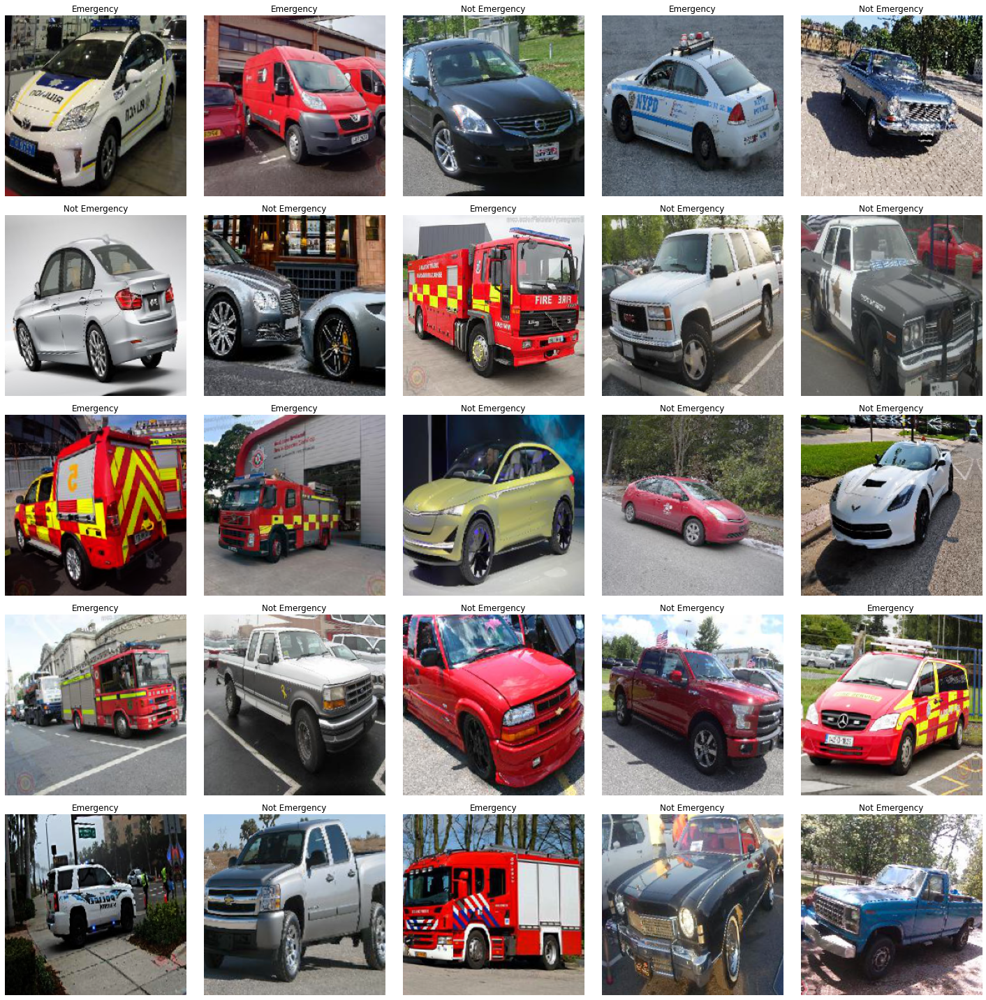

In [9]:
train_data.show_batch(ds_type = DatasetType.Train, rows = 5)

In [10]:
arch = models.resnet50
learn = cnn_learner(train_data, arch, metrics = accuracy)
learn.summary()

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


Sequential
Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [64, 112, 112]       9,408      False     
______________________________________________________________________
BatchNorm2d          [64, 112, 112]       128        True      
______________________________________________________________________
ReLU                 [64, 112, 112]       0          False     
______________________________________________________________________
MaxPool2d            [64, 56, 56]         0          False     
______________________________________________________________________
Conv2d               [64, 56, 56]         4,096      False     
______________________________________________________________________
BatchNorm2d          [64, 56, 56]         128        True      
______________________________________________________________________
Conv2d               [64, 56, 56]         36,864     False     
___________________________________________________

In [11]:
model_path = dataset_path/'models'
model_path.mkdir(parents = True, exist_ok = True)
learn.model_dir = model_path
learn_callbacks = [ShowGraph(learn), SaveModelCallback(learn), MixUpCallback(learn)]

In [12]:
def train(lrs, epochs = 15, path = None, cbs = None) : 
    learn.fit_one_cycle(epochs, lrs, callbacks = cbs)
    if path is not None : 
        learn.save(path)
    learn.recorder.plot_lr(show_moms = True)
    learn.show_results(ds_type = DatasetType.Valid, rows = 5)

def plot_lr() : 
    learn.lr_find()
    learn.recorder.plot()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


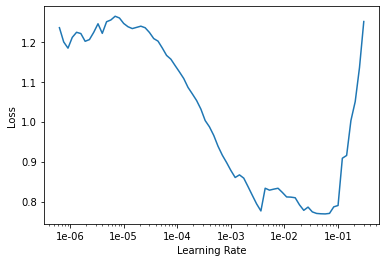

In [13]:
plot_lr()

epoch,train_loss,valid_loss,accuracy,time
0,1.109824,0.429742,0.802432,12:41
1,0.835071,0.219552,0.902736,12:30
2,0.746537,0.184913,0.933131,12:30
3,0.707567,0.177847,0.933131,12:32
4,0.646676,0.141309,0.954407,12:31
5,0.623987,0.154912,0.948328,12:29
6,0.595824,0.149895,0.948328,12:30
7,0.573986,0.145752,0.954407,12:30
8,0.574172,0.144248,0.954407,12:39
9,0.558185,0.144211,0.957447,12:36


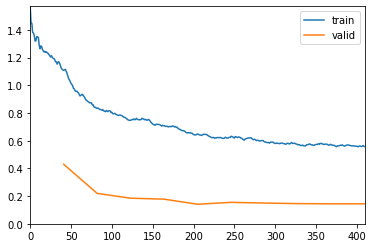

Better model found at epoch 0 with valid_loss value: 0.4297415316104889.
Better model found at epoch 1 with valid_loss value: 0.21955189108848572.
Better model found at epoch 2 with valid_loss value: 0.184912770986557.
Better model found at epoch 3 with valid_loss value: 0.1778465211391449.
Better model found at epoch 4 with valid_loss value: 0.1413092315196991.


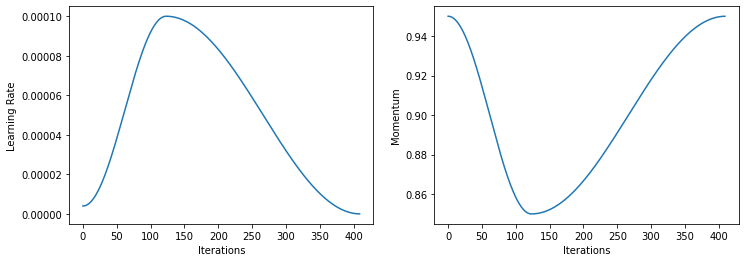

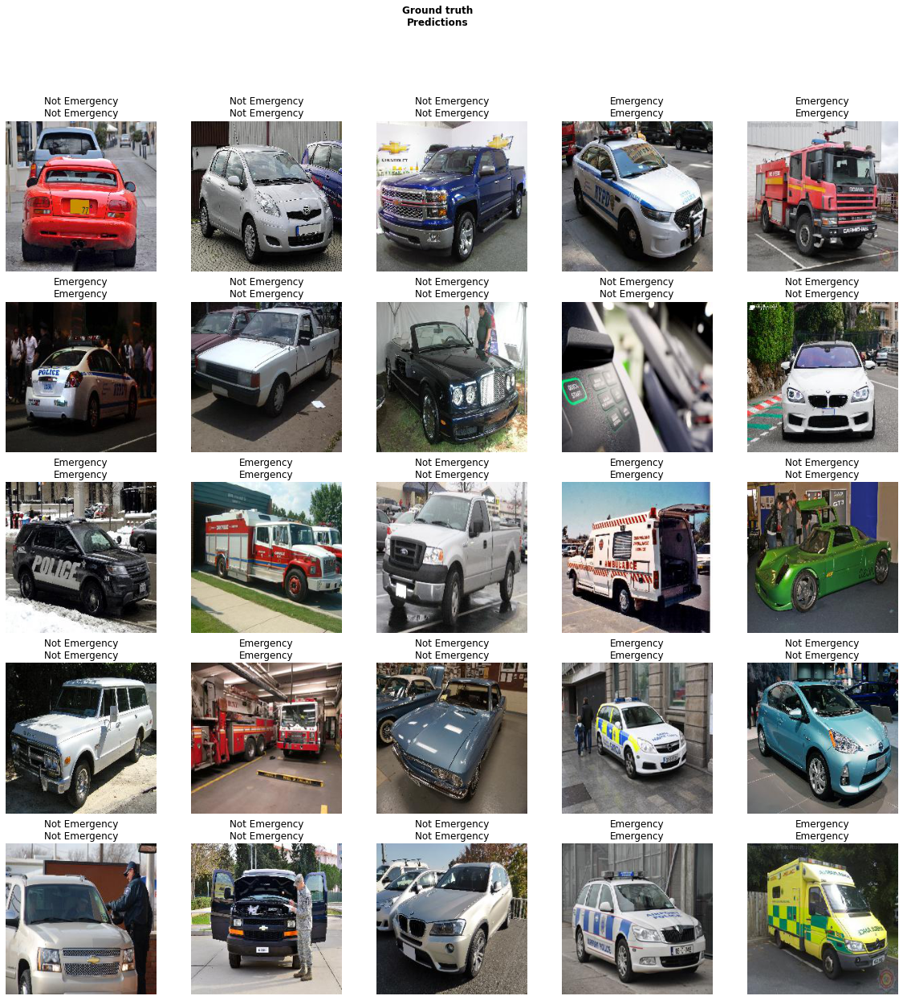

In [14]:
train(1e-4, 10, cbs = learn_callbacks)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


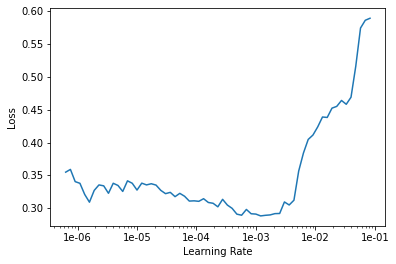

In [15]:
plot_lr()

epoch,train_loss,valid_loss,accuracy,time
0,0.615921,0.163876,0.939210,12:50
1,0.637402,0.252676,0.905775,12:45
2,0.612952,0.267180,0.908815,12:39
3,0.571080,0.165810,0.930091,12:39
4,0.492102,0.156001,0.942249,12:43
5,0.438389,0.184153,0.933131,12:54
6,0.389698,0.123060,0.954407,12:48
7,0.372198,0.119982,0.963526,12:34
8,0.356563,0.122069,0.963526,12:42
9,0.352822,0.116427,0.963526,12:44


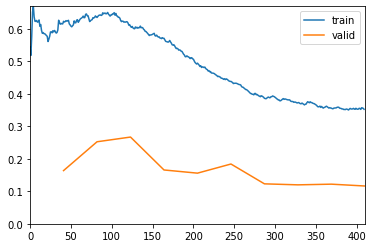

Better model found at epoch 0 with valid_loss value: 0.16387604176998138.
Better model found at epoch 4 with valid_loss value: 0.1560012400150299.
Better model found at epoch 6 with valid_loss value: 0.12306015938520432.
Better model found at epoch 7 with valid_loss value: 0.11998208612203598.
Better model found at epoch 9 with valid_loss value: 0.11642685532569885.


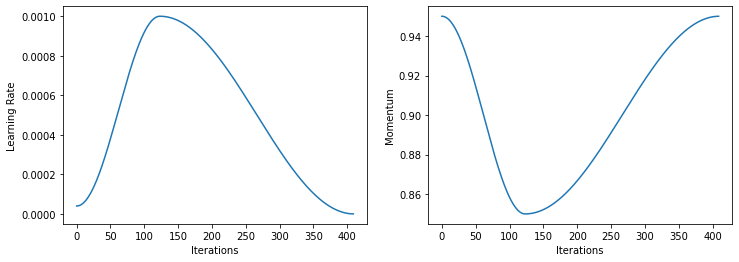

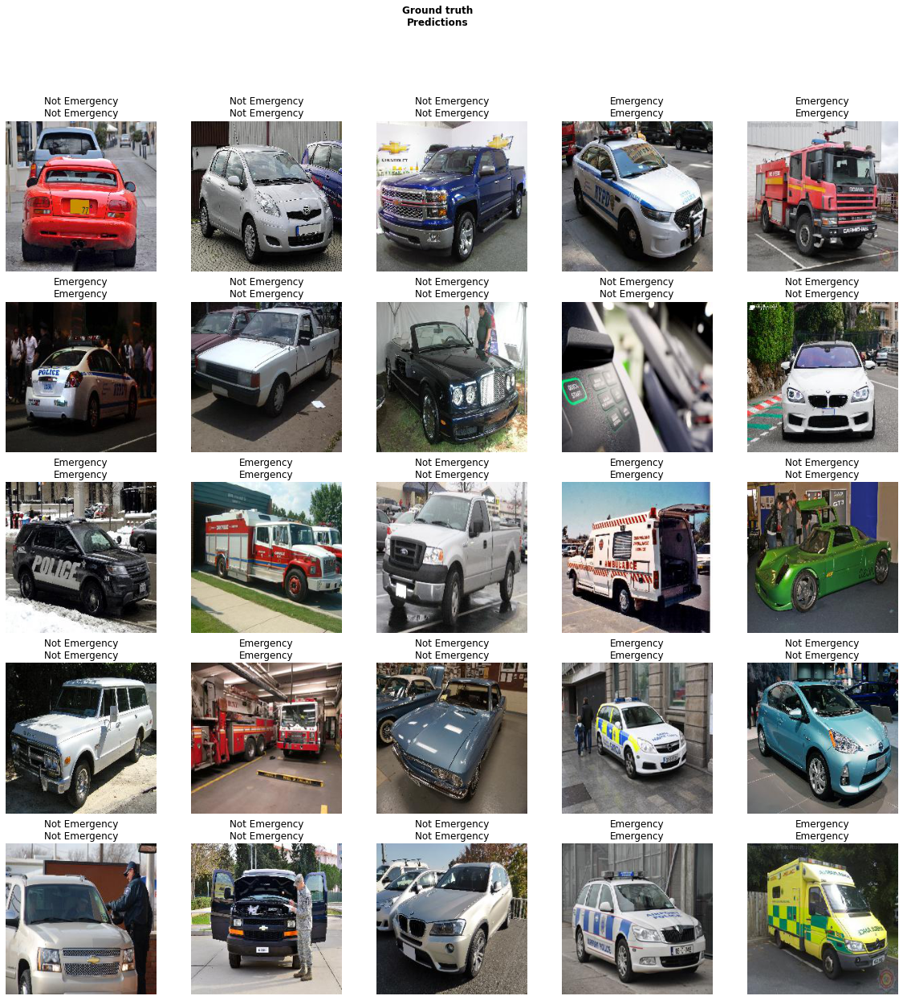

In [16]:
train(1e-3, 10, path = model_path/'emergency_basic', cbs = learn_callbacks)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


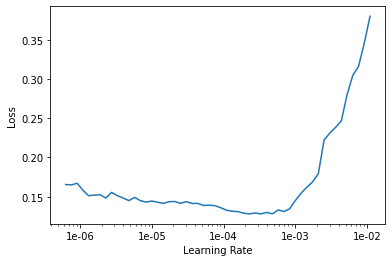

In [17]:
learn.unfreeze()
plot_lr()

epoch,train_loss,valid_loss,accuracy,time
0,0.337062,0.115818,0.966565,17:01
1,0.343713,0.119511,0.963526,17:05
2,0.334017,0.112508,0.963526,17:00
3,0.344400,0.102323,0.966565,16:55
4,0.327016,0.107304,0.963526,16:57
5,0.320855,0.101821,0.969605,16:52
6,0.327972,0.104670,0.963526,16:57
7,0.324184,0.097939,0.969605,16:51
8,0.332847,0.101228,0.972644,16:49
9,0.317912,0.099060,0.975684,16:57


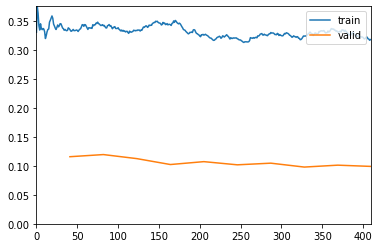

Better model found at epoch 0 with valid_loss value: 0.1158178374171257.
Better model found at epoch 2 with valid_loss value: 0.11250803619623184.
Better model found at epoch 3 with valid_loss value: 0.10232274979352951.
Better model found at epoch 5 with valid_loss value: 0.10182073712348938.
Better model found at epoch 7 with valid_loss value: 0.09793904423713684.


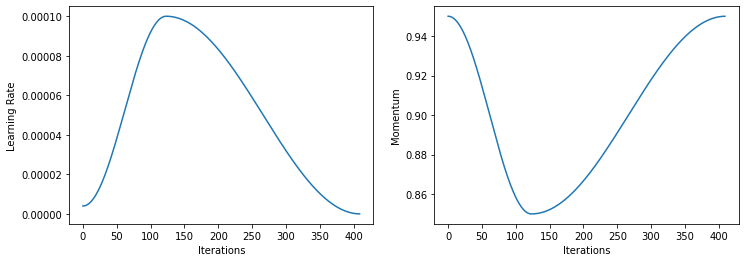

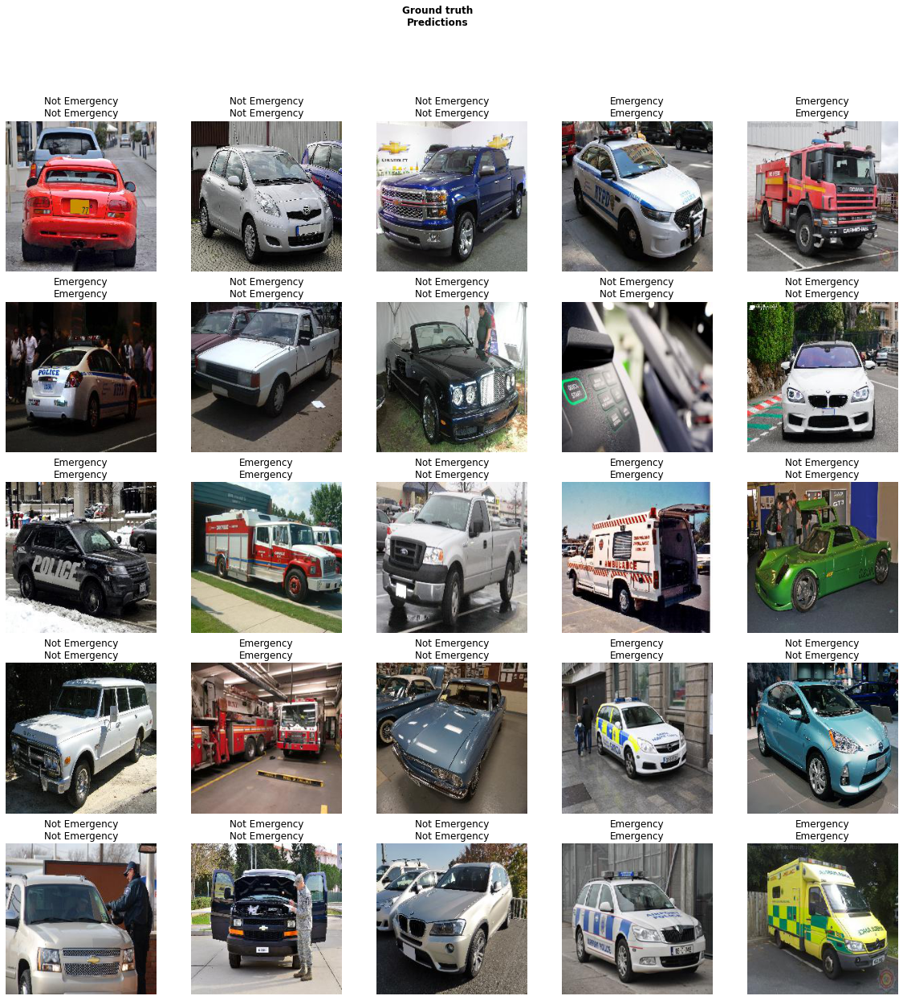

In [18]:
train(slice(1e-6, 1e-4), epochs = 10, path = model_path/'emergency_128', cbs = learn_callbacks)

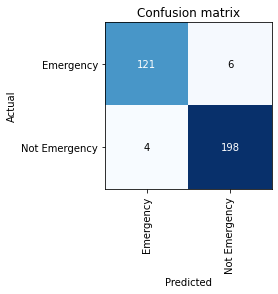

In [19]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

325 misclassified samples over 329 samples in the validation set.


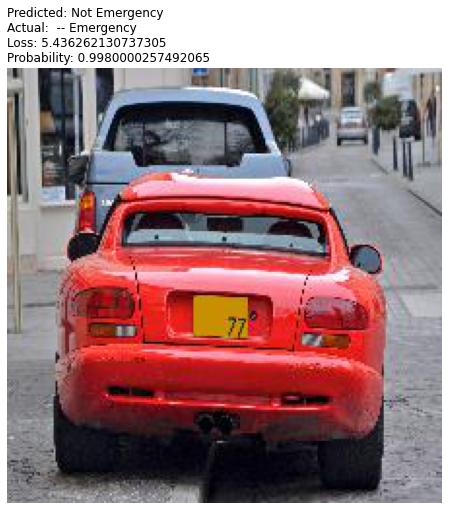

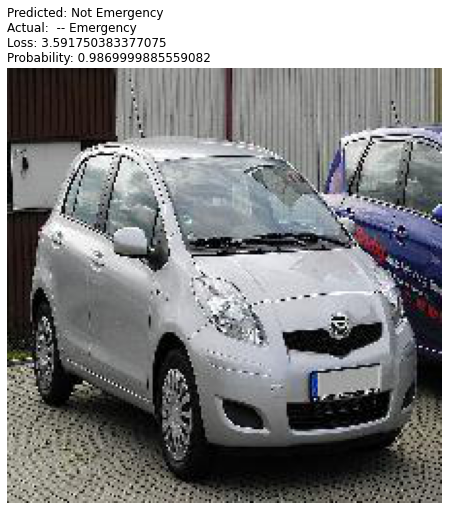

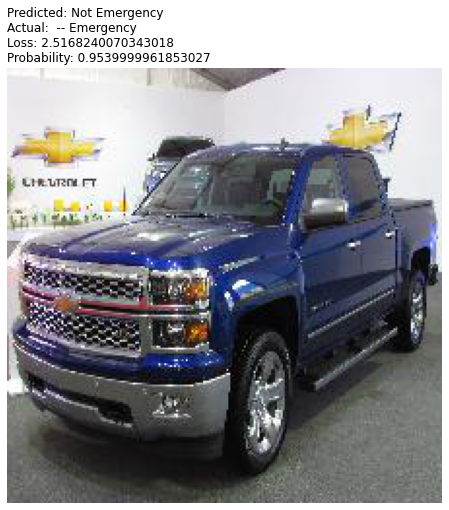

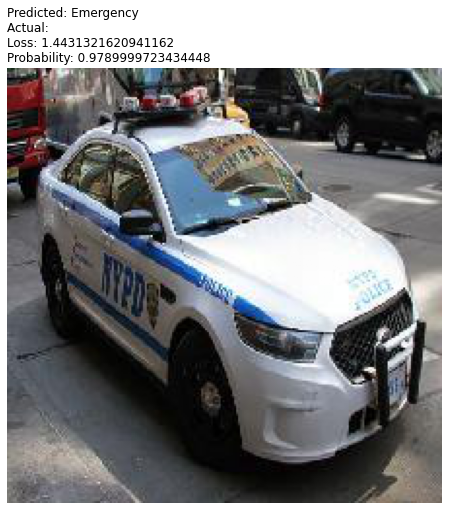

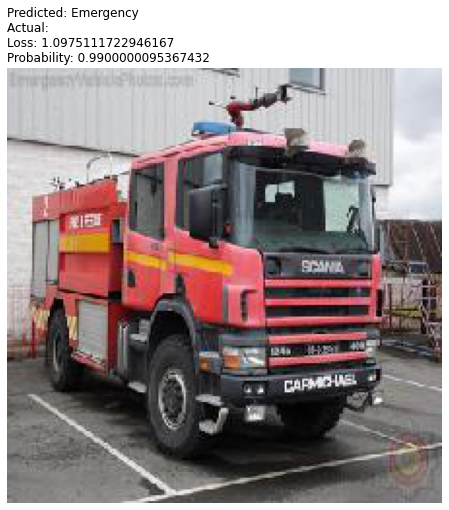

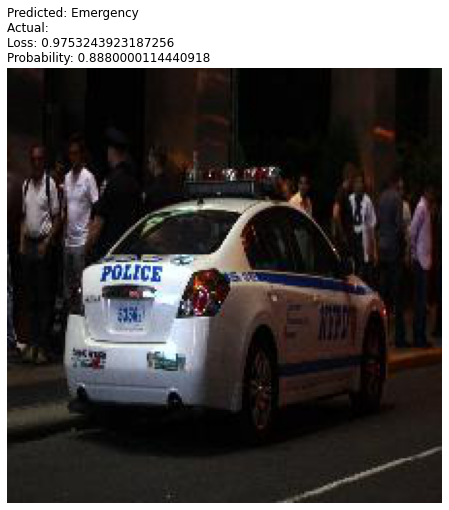

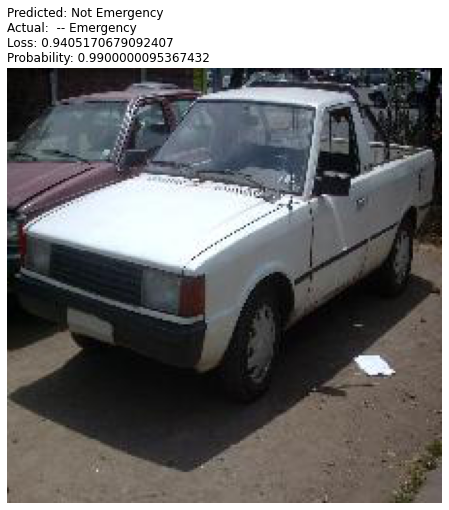

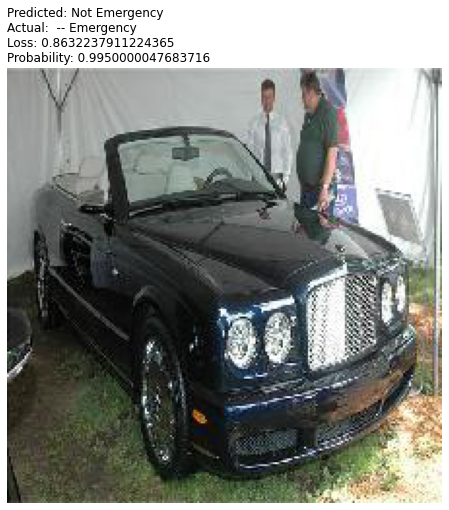

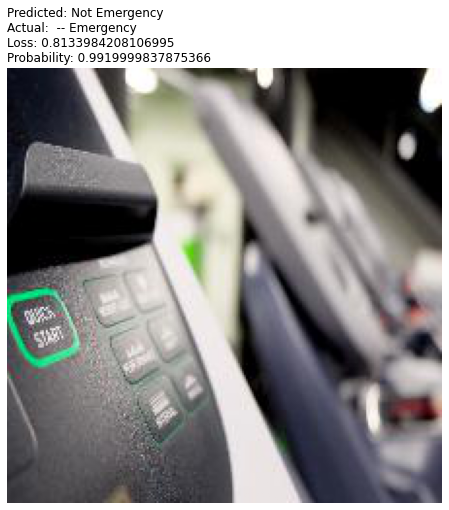

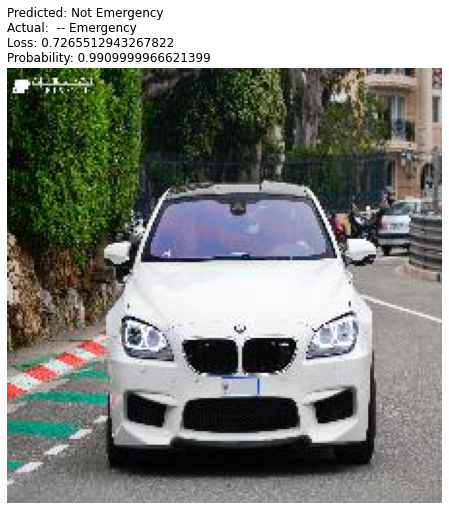

In [20]:
interp.plot_multi_top_losses(10)

In [21]:
learn.export(model_path/'emergency_final.pkl', destroy = True)

this Learner object self-destroyed - it still exists, but no longer usable


In [22]:
test_src = ImageList.from_df(test, cols = ['image_names'], path = images_path)
test_src

ImageList (706 items)
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
Path: /content/drive/MyDrive/janatahack cv/train/images

In [23]:
learn = load_learner(model_path, 'emergency_final.pkl', test = test_src)
predictions = learn.TTA(ds_type = DatasetType.Test)

In [24]:
preds = predictions[0].argmax(-1)
len(preds)

706

In [25]:
test_pred = {img : pred.item() for img, pred in zip(learn.data.test_dl.items, preds)}
len(test_pred)

706

In [26]:
test_pred = pd.DataFrame(test_pred.items())
test_pred.columns = ['image_file', 'label']
test_pred

,image_file,label
0,/content/drive/MyDrive/janatahack cv/train/ima...,1
1,/content/drive/MyDrive/janatahack cv/train/ima...,0
2,/content/drive/MyDrive/janatahack cv/train/ima...,1
3,/content/drive/MyDrive/janatahack cv/train/ima...,0
4,/content/drive/MyDrive/janatahack cv/train/ima...,1
...,...,...
701,/content/drive/MyDrive/janatahack cv/train/ima...,0
702,/content/drive/MyDrive/janatahack cv/train/ima...,1
703,/content/drive/MyDrive/janatahack cv/train/ima...,0
704,/content/drive/MyDrive/janatahack cv/train/ima...,1


In [27]:
sample_submission = pd.read_csv(dataset_path/'sample_submission_janatahack_cv.csv')
sample_submission

,image_names,emergency_or_not
0,1960.jpg,0
1,668.jpg,0
2,2082.jpg,0
3,808.jpg,0
4,1907.jpg,0
...,...,...
701,674.jpg,0
702,1027.jpg,0
703,447.jpg,0
704,2176.jpg,0


In [28]:
learn.data.classes

['Emergency', 'Not Emergency']

In [29]:
test_pred['file_name'] = test_pred['image_file'].apply(lambda x:x.split('/')[-1])
test_pred

,image_file,label,file_name
0,/content/drive/MyDrive/janatahack cv/train/ima...,1,1960.jpg
1,/content/drive/MyDrive/janatahack cv/train/ima...,0,668.jpg
2,/content/drive/MyDrive/janatahack cv/train/ima...,1,2082.jpg
3,/content/drive/MyDrive/janatahack cv/train/ima...,0,808.jpg
4,/content/drive/MyDrive/janatahack cv/train/ima...,1,1907.jpg
...,...,...,...
701,/content/drive/MyDrive/janatahack cv/train/ima...,0,674.jpg
702,/content/drive/MyDrive/janatahack cv/train/ima...,1,1027.jpg
703,/content/drive/MyDrive/janatahack cv/train/ima...,0,447.jpg
704,/content/drive/MyDrive/janatahack cv/train/ima...,1,2176.jpg


In [30]:
test_pred['category'] = test_pred['label'].replace({1:'Not Emergency', 0:'Emergency'})
test_pred['label'] = test_pred['category'].replace({'Not Emergency' : 0, 'Emergency' : 1})
test_pred

,image_file,label,file_name,category
0,/content/drive/MyDrive/janatahack cv/train/ima...,0,1960.jpg,Not Emergency
1,/content/drive/MyDrive/janatahack cv/train/ima...,1,668.jpg,Emergency
2,/content/drive/MyDrive/janatahack cv/train/ima...,0,2082.jpg,Not Emergency
3,/content/drive/MyDrive/janatahack cv/train/ima...,1,808.jpg,Emergency
4,/content/drive/MyDrive/janatahack cv/train/ima...,0,1907.jpg,Not Emergency
...,...,...,...,...
701,/content/drive/MyDrive/janatahack cv/train/ima...,1,674.jpg,Emergency
702,/content/drive/MyDrive/janatahack cv/train/ima...,0,1027.jpg,Not Emergency
703,/content/drive/MyDrive/janatahack cv/train/ima...,1,447.jpg,Emergency
704,/content/drive/MyDrive/janatahack cv/train/ima...,0,2176.jpg,Not Emergency


In [31]:
submission = test_pred[['file_name', 'label']]
submission.columns = sample_submission.columns
submission

,image_names,emergency_or_not
0,1960.jpg,0
1,668.jpg,1
2,2082.jpg,0
3,808.jpg,1
4,1907.jpg,0
...,...,...
701,674.jpg,1
702,1027.jpg,0
703,447.jpg,1
704,2176.jpg,0


In [33]:
submission.to_csv('submission_try7.csv', index = False)